In [1]:
import networkx as nx
import random
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import collections
import numpy as np
import hashlib
import sys

In [2]:
def gen_network(nodes_num,min_edges,max_edges):
  while True:
    G = nx.Graph()
    G.add_nodes_from(range(0,nodes_num))

    indexes_from = [*range(0,nodes_num)]
    random.shuffle(indexes_from)
    for i in indexes_from:
      edges_num = min_edges
      edges_left = edges_num - G.degree[i]
      if edges_left > 0:
        indexes_to = [*range(0,nodes_num)]
        random.shuffle(indexes_to)
        for adj_node in indexes_to:
          if adj_node != i and G.degree[adj_node] < max_edges and not G.has_edge(i,adj_node):
            G.add_edge(i, adj_node)
            edges_left = edges_left-1
            if edges_left <= 0:
              break
    if nx.is_connected(G): break
  return nodes_num, G


In [3]:
nodes_num, G = gen_network(1000,3,9)

In [4]:
options = {
    'node_color': 'red',
    'node_size': 5,
    'width': 1,
    'with_labels': False,
}

chord_options = {
    'node_color': 'lightgreen',
    'node_size': 100,
}

start_options = {
    'node_color': 'yellow',
    'node_size': 200,
}

end_options = {
    'node_color': 'coral',
    'node_size': 200,
}

path_options_nodes = {
    'node_color': 'red',
    'node_size': 15,
}

path_options_edges = {
    'edge_color' : 'red',
    'width': 4,
    'arrows': True
}

search_options_nodes = {
    'node_color': 'blue',
    'node_size': 10,
}

search_options_edges = {
    'edge_color' : 'blue',
    'width': 3,
    'arrows': True
}

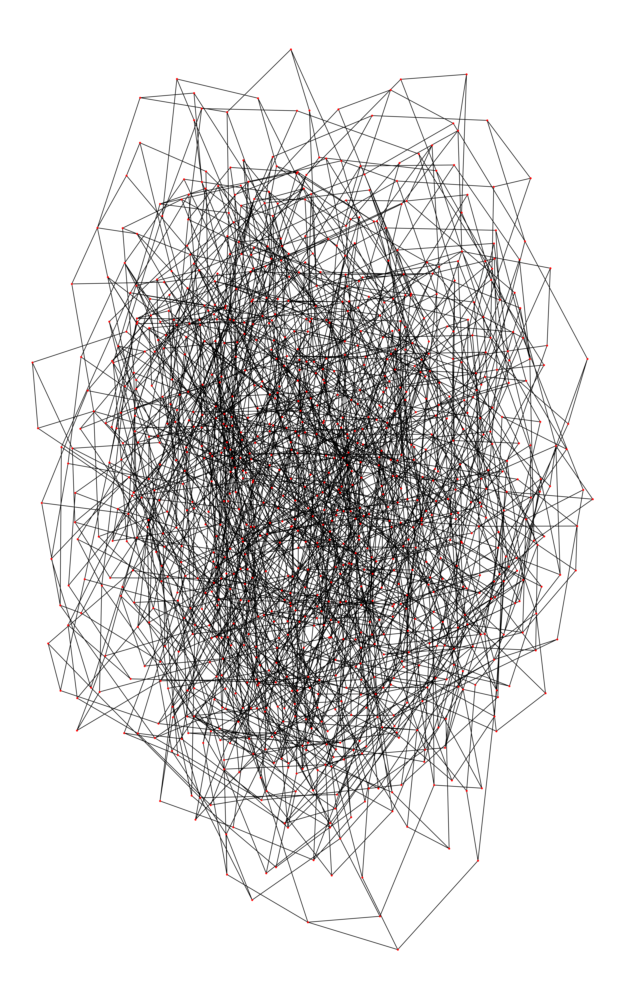

In [5]:
figure(figsize=(40, 30), dpi=340)
plt.subplot(121)
nx.draw(G, **options)

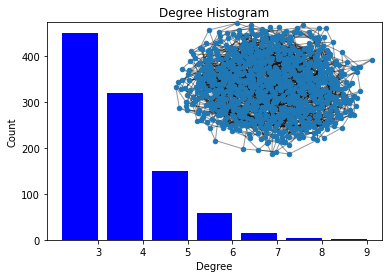

In [ ]:
degree_sequence = sorted([d for n, d in G.degree()], reverse=True) 
degreeCount = collections.Counter(degree_sequence)
deg, cnt = zip(*degreeCount.items())

fig, ax = plt.subplots()
plt.bar(deg, cnt, width=0.80, color="b")

plt.title("Degree Histogram")
plt.ylabel("Count")
plt.xlabel("Degree")
ax.set_xticks([d + 0.4 for d in deg])
ax.set_xticklabels(deg)

# рисуем гистограмму распределений степеней вершин
plt.axes([0.4, 0.4, 0.5, 0.5])
Gcc = G.subgraph(sorted(nx.connected_components(G), key=len, reverse=True)[0])
pos = nx.spring_layout(G)
plt.axis("off")
nx.draw_networkx_nodes(G, pos, node_size=20)
nx.draw_networkx_edges(G, pos, alpha=0.4)
plt.show()

In [6]:
m = 16
ids_space = 2 ** m
taken_ids = np.array([])
nodes_list = []
first_chorde_node = None
last_chorde_node = None

In [7]:
def chrod_distance(key_from, key_to):
  distance = ids_space
  if key_to < key_from:
    distance = ids_space - key_from + key_to
  else: 
    distance = key_to - key_from
  return distance

In [8]:
def initial_find_key_successor(key):
  closest_node = None
  closest_distance = ids_space
  for i in range (0,nodes_num):
    distance = chrod_distance(key,nodes_list[i].ID)
    if distance < closest_distance:
      closest_node = nodes_list[i]
      closest_distance = distance
  return closest_node

In [9]:
class Node:
  def __init__(self, node_number):
    self.number = node_number
    self.search_path = [self.number]
    while True:
      pre_ID = random.randint(0,ids_space-1)
      if not pre_ID in taken_ids:
        self.ID = pre_ID
        break

  def init_finger_table(self):
    self.finger_table = []
    self.finger_table_IDs = []
    for i in range(1,m+1):
      key = (self.ID + 2 ** (i-1)) % ids_space
      finger = initial_find_key_successor(key)
      if not finger.ID in self.finger_table_IDs:
        self.finger_table.append(finger)
        self.finger_table_IDs.append(finger.ID)

  def find_key_successor(self, key, search_path):
    if key == self.ID:
      return self
    if key <= first_chorde_node.ID or key > last_chorde_node.ID:
      search_path.append(first_chorde_node.number)
      return first_chorde_node
    if key > self.ID and key <= self.finger_table[0].ID:
      search_path.append(self.finger_table[0].number)
      return self.finger_table[0]
    else:
      n0 = self.closest_preceding_node(key)
      search_path.append(n0.number)
      return n0.find_key_successor(key, search_path)

  def closest_preceding_node(self, key):
    closest_distance = ids_space
    closest_finger = None
    for i in range (len(self.finger_table)-1,-1,-1):
      finger_node = self.finger_table[i]
      distance = chrod_distance(finger_node.ID,key)
      if distance < closest_distance:
        closest_distance = distance
        closest_finger = finger_node
    return closest_finger
  


In [22]:
def calculate_search_path_length(graph_nodes):
  length = 0
  for i in range(0,len(graph_nodes)-1):
    length += nx.shortest_path_length(G,source=graph_nodes[i],target=graph_nodes[i+1])
  return length

In [10]:
taken_ids = np.array([])
nodes_list = []

smallest_ID = ids_space
biggest_ID = -1
# создаём объекты узлов с доп. информацией для CHORD
for i in range (0,nodes_num):
  node = Node(i)
  nodes_list.append(node)
  if node.ID < smallest_ID:
    smallest_ID = node.ID
    first_chorde_node = node
  if node.ID > biggest_ID:
    biggest_ID = node.ID
    last_chorde_node = node

for i in range (0,nodes_num):
  nodes_list[i].init_finger_table()

In [23]:
# расчёт статистики объем хранимой инофрмации
min_keys = ids_space
max_keys = 0
avg_keys = 0
for node in nodes_list:
  keys = chrod_distance(node.ID, node.finger_table_IDs[0]) 
  avg_keys += keys
  if keys < min_keys:
    min_keys = keys
  if keys > max_keys:
    max_keys = keys
avg_keys /= nodes_num
print(min_keys)
print(max_keys)
print(avg_keys)

1
455
66.008


In [38]:
# расчёт статистики длины пути, задействованных ресурсов (100 * 100 разных путей)
indexes_from = [*range(0,500,5)]
indexes_to = [*range(500,nodes_num,5)]
random.shuffle(indexes_from)
random.shuffle(indexes_to)

min_path_length = ids_space
max_path_length = 0
avg_path_length = 0

min_seacrh_length = ids_space
max_search_length = 0
avg_search_length = 0

for i in range(0,100):
  for j in range(0,100):
    start = indexes_from[i]
    finish = indexes_to[j]

    path_length = nx.shortest_path_length(G,source=start,target=finish)
    avg_path_length += path_length
    if path_length < min_path_length:
      min_path_length = path_length
    if path_length > max_path_length:
      max_path_length = path_length

    search_path = [start]
    node = nodes_list[start].find_key_successor(nodes_list[finish].ID,search_path)

    search_length = calculate_search_path_length(search_path)
    avg_search_length += search_length
    if search_length < min_seacrh_length:
      min_seacrh_length = search_length
    if search_length > max_search_length:
      max_search_length = search_length

avg_path_length /= 100 ** 2
avg_search_length /= 100 ** 2

print(min_path_length)
print(max_path_length)
print(avg_path_length)
print(min_seacrh_length)
print(max_search_length)
print(avg_search_length)

1
8
5.5804
1
60
26.7424


In [17]:
nodes_list[5].ID

14678

In [ ]:
nodes_list[5].finger_table_IDs

[3427, 3456, 3526, 3654, 3968, 4415, 5521, 7500, 11588, 19809, 36159]

In [ ]:
# тестируем работу запросы информации на всём пространстве ключей для всех узлов
for node_number in range(0,nodes_num):
  for key in range(0,ids_space,500):
    node = nodes_list[node_number].find_key_successor(key,search_path)

In [ ]:
# тестируем работу запросы информации на всём пространстве ключей
for key in range(0,ids_space,100):
  node = nodes_list[5].find_key_successor(key,search_path)
  print(node.ID)

50
147
260
357
438
661
661
756
829
912
1013
1124
1210
1329
1413
1503
1604
1738
1871
2046
2046
2113
2206
2418
2418
2629
2629
2739
2945
2945
3014
3115
3284
3325
3427
3526
3634
3738
3826
3968
4042
4172
4224
4302
4404
4608
4608
4709
4801
4900
5036
5122
5370
5370
5521
5521
5652
5707
5814
5914
6063
6110
6249
6417
6417
6500
6625
6721
6811
6960
7039
7178
7205
7311
7411
7500
7647
7802
7802
7923
8048
8100
8243
8365
8414
8553
8618
8707
8812
9128
9128
9128
9223
9336
9407
9522
9646
9707
9849
9968
10052
10208
10208
10302
10401
10647
10647
10737
10829
10951
11097
11190
11201
11337
11493
11503
11719
11719
11805
11912
12074
12125
12206
12347
12416
12531
12618
12709
12828
12960
13025
13114
13244
13316
13451
13584
13629
13704
13832
13902
14056
14111
14246
14370
14425
14512
14615
14728
14819
14935
15034
15123
15227
15376
15416
15512
15651
15721
15948
15948
16049
16123
16235
16305
16414
16567
16615
16891
16891
16911
17055
17215
17215
17407
17407
17568
17693
17728
17810
17931
18079
18123
18217
18408
18408
1

In [21]:
def find_nodes_on_hop_distance(hop_distance):
  indexes_from = [*range(0,nodes_num)]
  indexes_to = [*range(0,nodes_num)]
  random.shuffle(indexes_from)
  random.shuffle(indexes_to)
  for i in range (0,nodes_num):
    for j in range (0,nodes_num):
      from_node = indexes_from[i]
      to_node = indexes_to[j]
      if nx.shortest_path_length(G,source=from_node,target=to_node) == hop_distance:
        return from_node, to_node

In [ ]:
from_node, to_node = find_nodes_on_hop_distance(5)

In [ ]:
search_path = [from_node]
node = nodes_list[from_node].find_key_successor(nodes_list[to_node].ID,search_path)

In [ ]:
search_path

[437, 1522, 1539, 1201, 926]

In [ ]:
nodes_list[from_node].ID

47231

In [ ]:
nodes_list[to_node].ID

49214

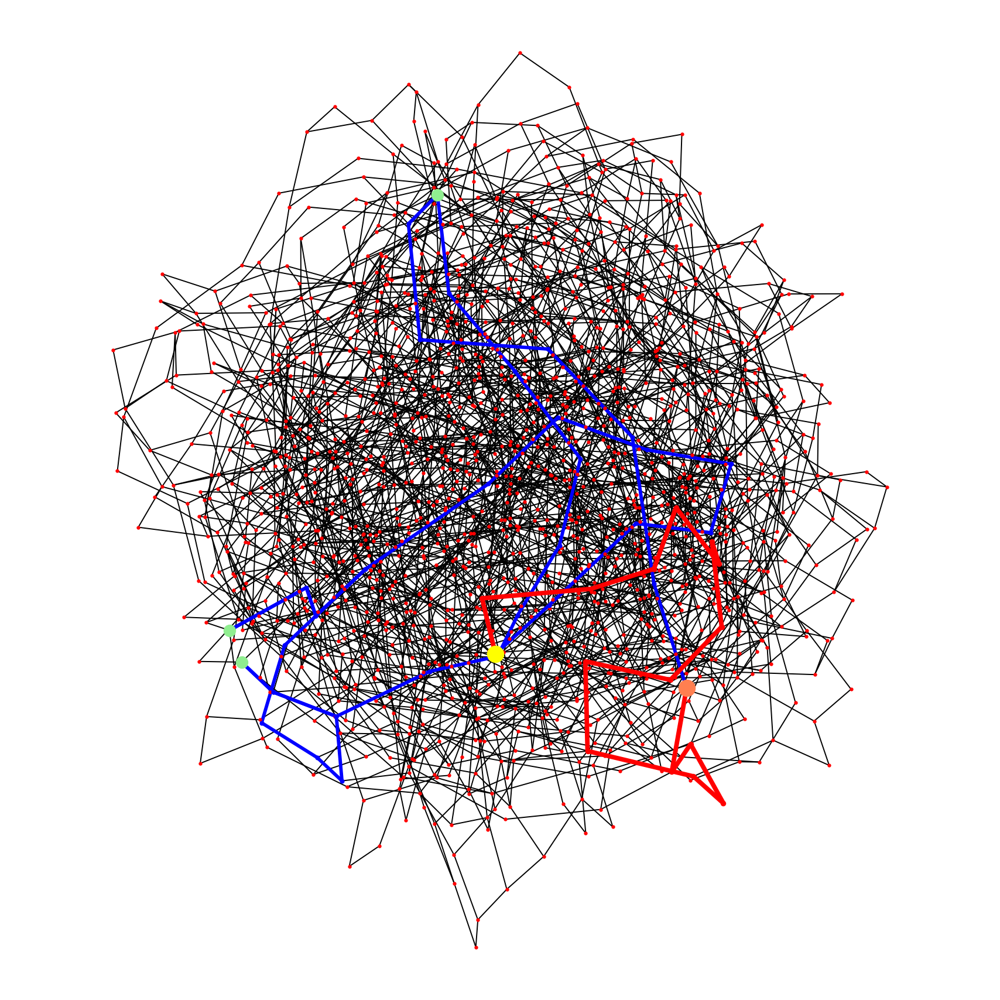

In [ ]:
figure(figsize=(12, 12), dpi=140)
#plt.subplot(121)
pos = nx.spring_layout(G)
nx.draw(G, pos, **options)

path = None
path_edges = None
for i in range(0,len(search_path)-1):
  from_ = search_path[i]
  to_ = search_path[i+1]
  if path is None:
    path = nx.shortest_path(G,source=from_,target=to_)
    path_edges_pre = zip(path,path[1:])
    path_edges = list(path_edges_pre)
  else:
    path_ = nx.shortest_path(G,source=from_,target=to_)
    path_edges_pre = zip(path_,path_[1:])
    path_edges_ = list(path_edges_pre)
    path.extend(path_)
    path_edges.extend(path_edges_)


path_between_nodes = nx.shortest_path(G,source=search_path[0],target=search_path[len(search_path)-1])
path_between_nodes_edges = zip(path_between_nodes,path_between_nodes[1:])
path_between_nodes_edges = list(path_between_nodes_edges)

nx.draw_networkx_nodes(G,pos,nodelist=path,**search_options_nodes)
nx.draw_networkx_edges(G,pos,edgelist=path_edges,**search_options_edges)

nx.draw_networkx_nodes(G,pos,nodelist=path_between_nodes,**path_options_nodes)
nx.draw_networkx_edges(G,pos,edgelist=path_between_nodes_edges,**path_options_edges)

nx.draw_networkx_nodes(G,pos,nodelist=search_path,**chord_options)

nx.draw_networkx_nodes(G,pos,nodelist=[search_path[0]],**start_options)

nx.draw_networkx_nodes(G,pos,nodelist=[search_path[len(search_path)-1]],**end_options)

plt.axis('equal')
plt.show()